In [1]:
import glob
import pandas as pd
from scipy import stats
import numpy as np
import itertools

from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
file_list = glob.glob('../output/infodata*.csv')

n = len(file_list) # Número de sementes: 10 (Número de arquivos lido)
dfs = [pd.read_csv(file) for file in file_list]

df = pd.concat(dfs)
df = df[df['vType'] == 'emergency_emergency']
df.head(2)

,id,depart,departLane,departPos,departPosLat,departSpeed,departDelay,arrival,arrivalLane,arrivalPos,...,PMx_abs,NOx_abs,fuel_abs,seed,ALGORITHM,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,CAR_FOLLOW_MODEL,TIME_TO_BLOCK_CREATE_ACCIDENTS,SAVEDS,UNSAVEDS
1729,veh_emergency_390.0,424.0,C1B1_0,6.6,0.0,0.0,4.0,762.0,E0D0_2,276.8,...,22.348299,459.912327,345230.514945,1282538739,default,30.0,Krauss,50.0,3,6
2325,veh_emergency_670.0,701.0,C1B1_0,6.6,0.0,0.0,1.0,993.0,E0D0_1,276.8,...,20.804755,427.673011,322743.178045,1282538739,default,30.0,Krauss,50.0,3,6


In [3]:
df.describe()

,depart,departPos,departPosLat,departSpeed,departDelay,arrival,arrivalPos,arrivalPosLat,arrivalSpeed,duration,...,CO2_abs,HC_abs,PMx_abs,NOx_abs,fuel_abs,seed,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,TIME_TO_BLOCK_CREATE_ACCIDENTS,SAVEDS,UNSAVEDS
count,1065.000000,1065.0,1065.0,1065.0,1065.000000,1065.000000,1065.000000,1065.000000,1065.000000,1065.000000,...,1.065000e+03,1065.000000,1065.000000,1065.000000,1.065000e+03,1.065000e+03,1065.000000,1065.000000,1065.000000,1065.000000
mean,708.412207,6.6,0.0,0.0,6.543662,1473.388732,273.577465,-0.149371,12.872770,764.976526,...,2.162322e+06,484.019633,48.035559,947.137432,6.897095e+05,1.115454e+09,70.732394,72.206573,5.367136,2.847887
std,286.738557,0.0,0.0,0.0,76.646453,535.203588,1.583592,0.592469,6.896473,447.697791,...,1.161595e+06,344.862431,28.333689,527.261527,3.705190e+05,5.407029e+08,44.818229,24.855117,2.551619,1.810931
min,330.000000,6.6,0.0,0.0,0.000000,543.000000,272.800000,-1.520000,3.850000,124.000000,...,5.245089e+05,50.270394,10.465323,222.986393,1.672992e+05,2.004967e+08,30.000000,50.000000,0.000000,0.000000
25%,470.000000,6.6,0.0,0.0,0.000000,1048.000000,272.800000,-0.520000,5.560000,428.000000,...,1.307672e+06,218.345819,26.796502,557.909658,4.171016e+05,6.338163e+08,30.000000,50.000000,4.000000,1.000000
50%,640.000000,6.6,0.0,0.0,0.000000,1411.000000,272.800000,-0.320000,13.000000,667.000000,...,1.905635e+06,400.457459,41.141790,825.102681,6.078287e+05,1.282539e+09,30.000000,50.000000,5.000000,3.000000
75%,912.000000,6.6,0.0,0.0,1.000000,1830.000000,272.800000,0.080000,20.050000,996.000000,...,2.752079e+06,645.863650,61.600163,1212.474760,8.778311e+05,1.410143e+09,120.000000,100.000000,7.000000,4.000000
max,2894.000000,6.6,0.0,0.0,1824.000000,3918.000000,276.800000,1.520000,20.830000,3217.000000,...,7.760217e+06,2274.644053,188.495502,3522.327387,2.475309e+06,1.954325e+09,120.000000,100.000000,12.000000,7.000000


In [4]:
lista_index = ['ALGORITHM', 'TIME_TO_BLOCK_CREATE_ACCIDENTS', 'DELAY_TO_DISPATCH_EMERGENCY_VEHICLE','CAR_FOLLOW_MODEL']
to_exclude = [
    'id', 'depart', 'departLane', 'departPos', 'departPosLat',
    'departSpeed', 'departDelay', 'arrival', 'arrivalLane', 'arrivalPos', 'arrivalPosLat',
    'arrivalSpeed','devices','vaporized','vType', 'seed', 'speedFactor', 'rerouteNo', 'routeLength',
    'stopTime', 'waitingTime', 'waitingCount'
]
var_resposta = list(
    set(df.columns) - set(
        lista_index + to_exclude
    )
)
var_resposta

['NOx_abs',
 'PMx_abs',
 'SAVEDS',
 'CO_abs',
 'fuel_abs',
 'UNSAVEDS',
 'timeLoss',
 'duration',
 'CO2_abs',
 'HC_abs']

In [5]:
# Pruning datafrme
df_cleanned = df.drop(columns=to_exclude)
df_cleanned

,duration,timeLoss,CO_abs,CO2_abs,HC_abs,PMx_abs,NOx_abs,fuel_abs,ALGORITHM,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,CAR_FOLLOW_MODEL,TIME_TO_BLOCK_CREATE_ACCIDENTS,SAVEDS,UNSAVEDS
1729,338.0,193.24,32911.790758,1.082362e+06,175.037600,22.348299,459.912327,3.452305e+05,default,30.0,Krauss,50.0,3,6
2325,292.0,184.68,29248.451159,1.011862e+06,156.505424,20.804755,427.673011,3.227432e+05,default,30.0,Krauss,50.0,3,6
3244,926.0,568.28,103717.197143,2.902773e+06,539.353721,62.735040,1243.854990,9.258765e+05,default,30.0,Krauss,50.0,3,6
3367,1152.0,781.06,146133.716738,3.053818e+06,736.647261,69.426288,1351.611995,9.740726e+05,default,30.0,Krauss,50.0,3,6
3517,968.0,635.84,118250.201426,2.617551e+06,599.272149,58.033407,1147.552097,8.349143e+05,default,30.0,Krauss,50.0,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59369,477.0,266.21,44289.776388,1.586018e+06,238.685616,32.506337,675.238612,5.058745e+05,proposto,120.0,EIDM,100.0,5,2
59640,426.0,294.35,49441.731449,1.239790e+06,253.773157,26.022476,534.924374,3.954506e+05,proposto,120.0,EIDM,100.0,5,2
60058,254.0,150.20,27742.269764,7.169165e+05,142.739894,15.175622,308.931741,2.286711e+05,proposto,120.0,EIDM,100.0,5,2
60674,1171.0,949.23,152004.045606,3.278365e+06,768.305924,72.216755,1436.344534,1.045696e+06,proposto,120.0,EIDM,100.0,5,2


In [6]:
df_cleanned.describe()

,duration,timeLoss,CO_abs,CO2_abs,HC_abs,PMx_abs,NOx_abs,fuel_abs,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,TIME_TO_BLOCK_CREATE_ACCIDENTS,SAVEDS,UNSAVEDS
count,1065.000000,1065.000000,1065.000000,1.065000e+03,1065.000000,1065.000000,1065.000000,1.065000e+03,1065.000000,1065.000000,1065.000000,1065.000000
mean,764.976526,568.403690,95241.168145,2.162322e+06,484.019633,48.035559,947.137432,6.897095e+05,70.732394,72.206573,5.367136,2.847887
std,447.697791,425.777154,69830.395485,1.161595e+06,344.862431,28.333689,527.261527,3.705190e+05,44.818229,24.855117,2.551619,1.810931
min,124.000000,37.810000,8312.052694,5.245089e+05,50.270394,10.465323,222.986393,1.672992e+05,30.000000,50.000000,0.000000,0.000000
25%,428.000000,239.410000,41576.383018,1.307672e+06,218.345819,26.796502,557.909658,4.171016e+05,30.000000,50.000000,4.000000,1.000000
50%,667.000000,461.840000,78141.596780,1.905635e+06,400.457459,41.141790,825.102681,6.078287e+05,30.000000,50.000000,5.000000,3.000000
75%,996.000000,756.440000,127669.864585,2.752079e+06,645.863650,61.600163,1212.474760,8.778311e+05,120.000000,100.000000,7.000000,4.000000
max,3217.000000,2752.880000,459630.213123,7.760217e+06,2274.644053,188.495502,3522.327387,2.475309e+06,120.000000,100.000000,12.000000,7.000000


In [7]:
df_cleanned.loc[df_cleanned['ALGORITHM'] == 'default', 'ALGORITHM'] = 'sem Green Wave'
df_cleanned.loc[df_cleanned['ALGORITHM'] == 'proposto', 'ALGORITHM'] = 'com Green Wave'

In [8]:
df_cleanned.loc[df_cleanned['ALGORITHM'] == 'sem Green Wave'].count(), df_cleanned.loc[df_cleanned['ALGORITHM'] == 'com Green Wave'].count()


(duration                               507
 timeLoss                               507
 CO_abs                                 507
 CO2_abs                                507
 HC_abs                                 507
 PMx_abs                                507
 NOx_abs                                507
 fuel_abs                               507
 ALGORITHM                              507
 DELAY_TO_DISPATCH_EMERGENCY_VEHICLE    507
 CAR_FOLLOW_MODEL                       507
 TIME_TO_BLOCK_CREATE_ACCIDENTS         507
 SAVEDS                                 507
 UNSAVEDS                               507
 dtype: int64,
 duration                               558
 timeLoss                               558
 CO_abs                                 558
 CO2_abs                                558
 HC_abs                                 558
 PMx_abs                                558
 NOx_abs                                558
 fuel_abs                               558
 ALGORITHM       

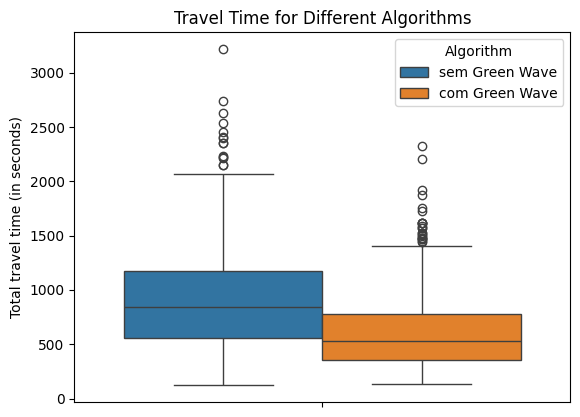

In [11]:
sns.boxplot(data=df_cleanned, y='duration', hue='ALGORITHM')

plt.ylabel("Total travel time (in seconds)")
plt.title("Travel Time for Different Algorithms")
plt.legend(title='Algorithm')
plt.show()

<Axes: xlabel='duration', ylabel='Count'>

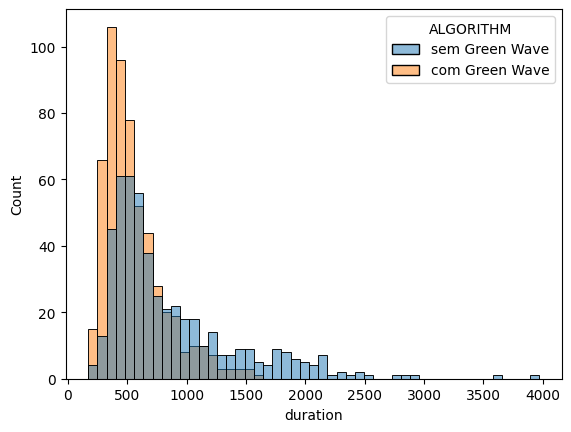

In [125]:
# custom_params = {"axes.spines.right": False, "axes.spines.top": False}
# sns.set_theme(style="white", context="talk")
sns.histplot(data=df_cleanned, x='duration', hue='ALGORITHM')

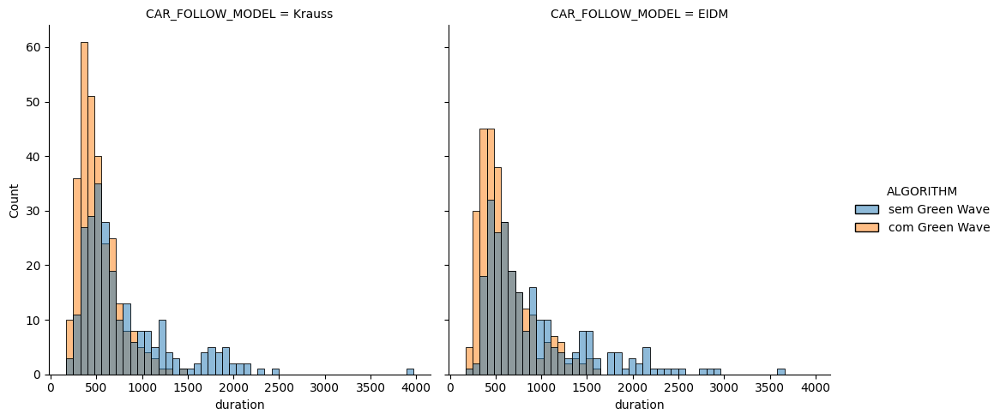

In [126]:
sns.displot(
    data=df_cleanned, x='duration',
    col='CAR_FOLLOW_MODEL', hue='ALGORITHM',
)

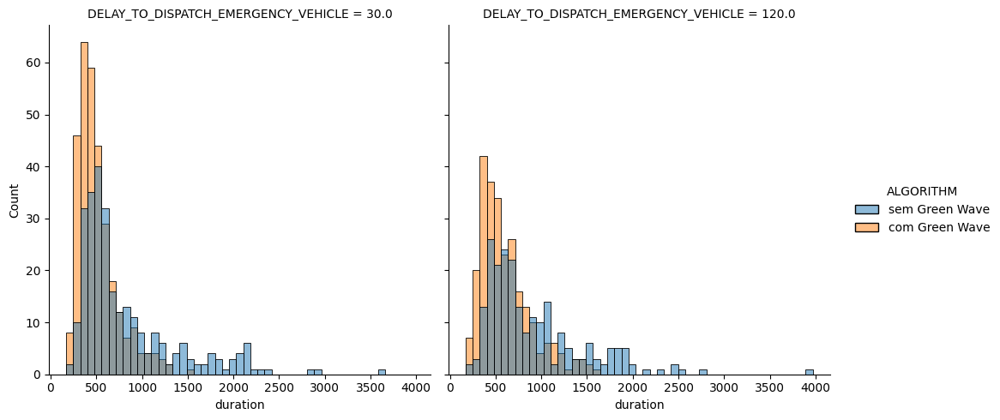

In [145]:
sns.displot(
    data=df_cleanned, x='duration',
    col='DELAY_TO_DISPATCH_EMERGENCY_VEHICLE', hue='ALGORITHM',
)

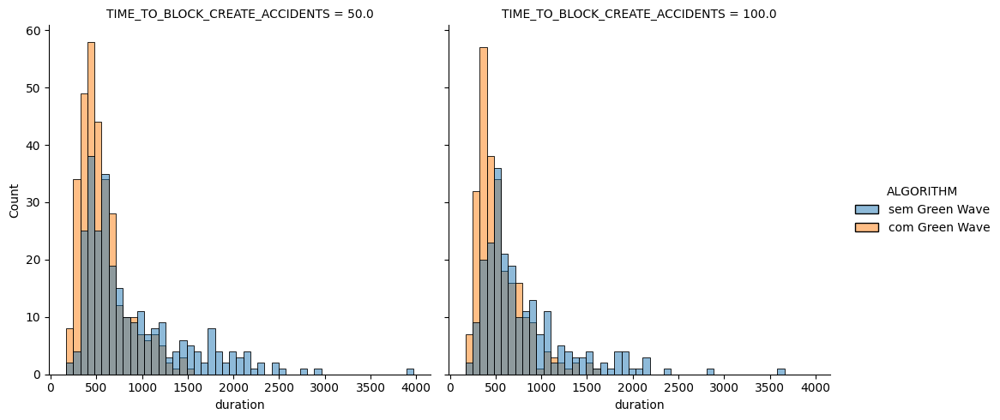

In [146]:
sns.displot(
    data=df_cleanned, x='duration',
    col='TIME_TO_BLOCK_CREATE_ACCIDENTS', hue='ALGORITHM',
)

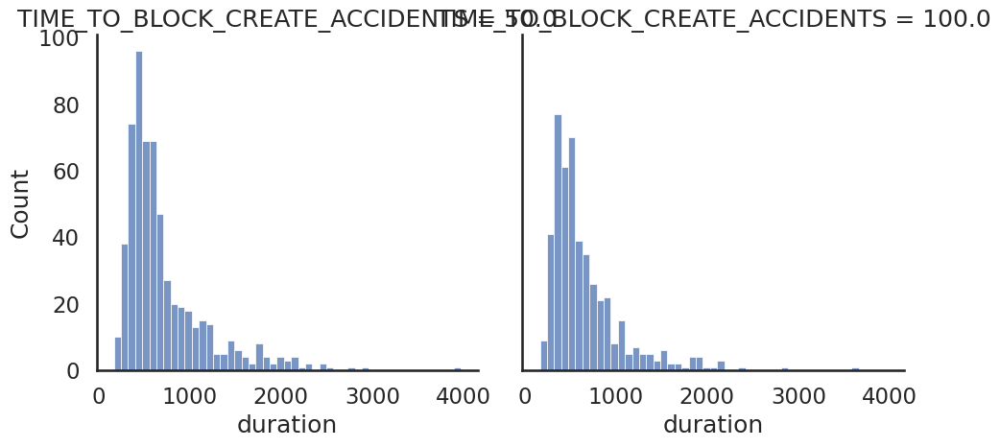

In [139]:
sns.displot(
    data=df_cleanned, x='duration',
    col='TIME_TO_BLOCK_CREATE_ACCIDENTS', 
)

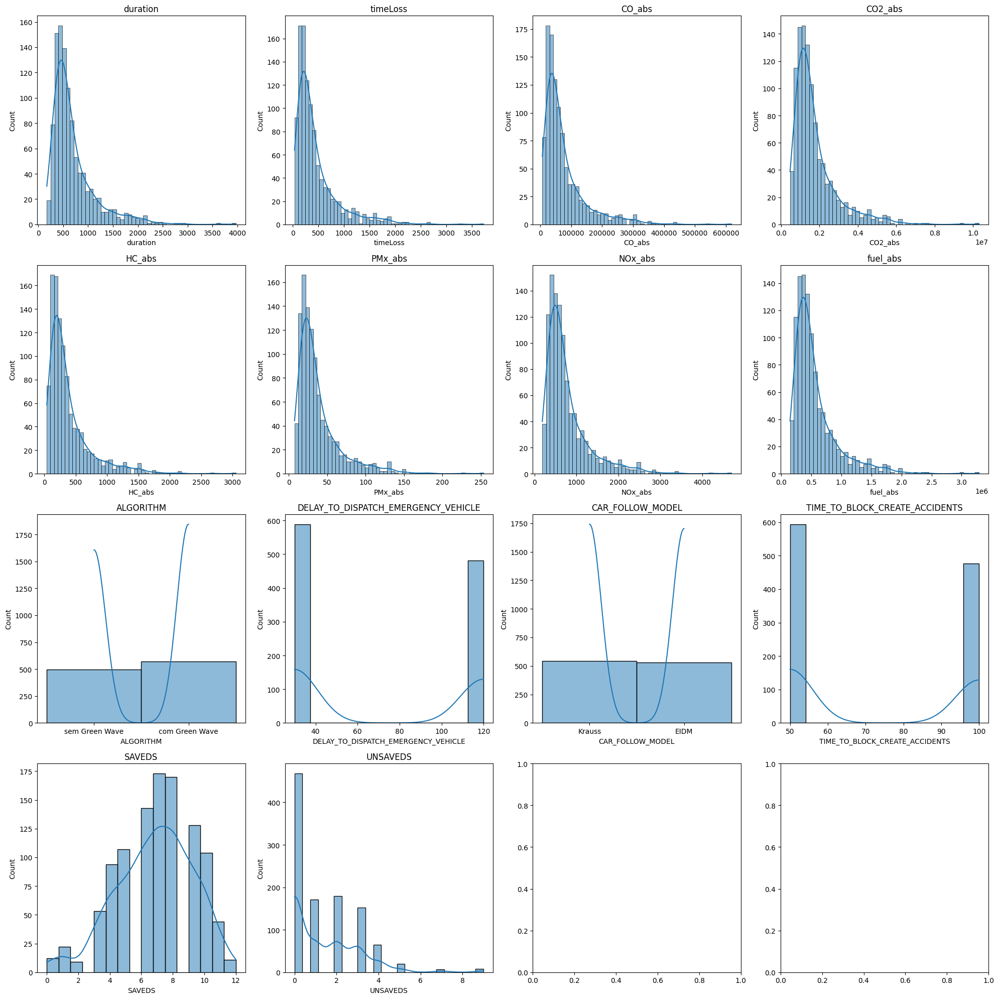

In [17]:
# Visualização
def plot_distributions(dataframe: pd.DataFrame):
    num_cols = len(dataframe.columns)
    num_rows = (num_cols + 3) // 4  # Ajuste o número de colunas por linha conforme necessário
    fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
    for i, col in enumerate(dataframe.columns):
        ax = axes[i // 4, i % 4]
        sns.histplot(dataframe[col].dropna(), kde=True, ax=ax)
        ax.set_title(col)
    
    plt.tight_layout()
    plt.show()

plot_distributions(df_cleanned)

In [18]:
grouped = df.drop(columns=to_exclude).groupby(lista_index).agg(['mean', 'std']).reset_index()
grouped[lista_index].apply(lambda x: '-'.join(x.astype(str)), axis=1)

0          default-50.0-30.0-EIDM
1        default-50.0-30.0-Krauss
2         default-50.0-120.0-EIDM
3       default-50.0-120.0-Krauss
4         default-100.0-30.0-EIDM
5       default-100.0-30.0-Krauss
6        default-100.0-120.0-EIDM
7      default-100.0-120.0-Krauss
8         proposto-50.0-30.0-EIDM
9       proposto-50.0-30.0-Krauss
10       proposto-50.0-120.0-EIDM
11     proposto-50.0-120.0-Krauss
12       proposto-100.0-30.0-EIDM
13     proposto-100.0-30.0-Krauss
14      proposto-100.0-120.0-EIDM
15    proposto-100.0-120.0-Krauss
dtype: object

In [19]:
grouped = df.drop(columns=to_exclude).groupby(lista_index).agg(['mean','std']).reset_index()
#Criando coluna ID para o gráfico de barra com intervalo de confiança
grouped['id'] = grouped[lista_index].apply(lambda x: '-'.join(x.astype(str)), axis=1)
grouped.sort_values(by=lista_index,ascending=[True, True,True,True], inplace=True)

ALGORITHM TIME_TO_BLOCK_CREATE_ACCIDENTS  \
                                              
0    default                           50.0   
1    default                           50.0   
2    default                           50.0   
3    default                           50.0   
4    default                          100.0   
5    default                          100.0   
6    default                          100.0   
7    default                          100.0   
8   proposto                           50.0   
9   proposto                           50.0   
10  proposto                           50.0   
11  proposto                           50.0   
12  proposto                          100.0   
13  proposto                          100.0   
14  proposto                          100.0   
15  proposto                          100.0   

   DELAY_TO_DISPATCH_EMERGENCY_VEHICLE CAR_FOLLOW_MODEL    duration  \
                                                               mean   
0                                 30.0             EIDM  978.750000   
1                                 30.0           Krauss  778.084507   
2                                120.0             EIDM  970.666667   
3                                120.0           Krauss  880.390625   
4                                 30.0             EIDM  859.900000   
5                                 30.0           Krauss  630.250000   
6                                120.0             EIDM  807.875000   
7                                120.0           Krauss  963.431373   
8                                 30.0             EIDM  530.386364   
9                                 30.0           Krauss  524.705882   
10                               120.0             EIDM  695.753623   
11                               120.0           Krauss  537.181818   
12                                30.0             EIDM  507.185714   
13                                30.0           Krauss  464.056338   
14                               120.0             EIDM  680.185185   
15                               120.0           Krauss  520.275862   

                  timeLoss                     CO_abs                 ...  \
           std        mean         std           mean            std  ...   
0   610.972259  726.693000  602.510915  120800.280264   98369.451058  ...   
1   462.593087  528.031127  455.428223   89421.608598   74079.133933  ...   
2   591.249687  692.478000  571.183214  116517.281055   93296.425848  ...   
3   636.108821  637.038906  619.862812  106611.222220  101848.708371  ...   
4   657.283281  606.792500  642.842417  100738.135139  104927.759405  ...   
5   375.975810  402.463750  368.087491   67766.151400   59750.324266  ...   
6   339.486698  536.350833  329.426605   90889.190451   53425.381659  ...   
7   534.387509  706.120392  529.953603  118182.009226   85757.782184  ...   
8   231.476939  284.568977  215.445673   49210.823162   34782.198632  ...   
9   231.657425  284.691294  203.569421   49967.901770   33762.013510  ...   
10  309.058504  426.180435  289.668505   73927.292868   47459.502350  ...   
11  240.771607  296.216623  216.986318   51766.996970   35827.331006  ...   
12  254.241885  264.479286  241.786058   45639.536488   38895.862565  ...   
13  165.237828  229.326197  147.400403   40060.656752   23900.963940  ...   
14  341.187000  397.716296  303.377650   69760.504556   51549.557719  ...   
15  211.199979  279.358793  186.125806   49187.540568   30904.070999  ...   

      PMx_abs      NOx_abs                   fuel_abs                 \
          std         mean         std           mean            std   
0   39.474784  1097.503041  723.679730  790994.736654  504138.552709   
1   29.769139   877.923430  546.571473  639521.588304  380995.651130   
2   37.329537  1071.889766  683.596416  774203.356576  475849.239814   
3   40.800101   996.197947  747.166660  721045.932826  520319.803213   
4   42.274655   952.916040  774.845041  691077.665034  539

In [20]:
def calc_interval(grouped,var_resposta,n = 10,column_x = 'id', rotation = 0, z = stats.norm.ppf(0.975)):
    for var in var_resposta:
        #Calculo do erro médio para o intervalo de confiança
        grouped[(var, 'mean_error')] = z * (grouped[(var, 'std')] / np.sqrt(n)) 

In [21]:
calc_interval(grouped=grouped, var_resposta=var_resposta)

In [22]:
num_factors = len(lista_index)
factor_names = lista_index
factor_levels_real = {factor:list(grouped[factor].unique()) for factor in factor_names}
num_factors, factor_levels_real

(4,
 {'ALGORITHM': ['default', 'proposto'],
  'TIME_TO_BLOCK_CREATE_ACCIDENTS': [50.0, 100.0],
  'DELAY_TO_DISPATCH_EMERGENCY_VEHICLE': [30.0, 120.0],
  'CAR_FOLLOW_MODEL': ['EIDM', 'Krauss']})

In [23]:
num_response_vars = len(var_resposta)
response_vars_names = var_resposta
num_response_vars, response_vars_names

(10,
 ['fuel_abs',
  'CO_abs',
  'PMx_abs',
  'NOx_abs',
  'duration',
  'timeLoss',
  'HC_abs',
  'UNSAVEDS',
  'SAVEDS',
  'CO2_abs'])

In [24]:
# Calculating the total number of experiments
total_experiments = 2 ** num_factors
total_experiments

16

In [25]:
# Preparing the DataFrame
level_combinations = list(itertools.product([-1, 1], repeat=num_factors))
experiment_design_df = pd.DataFrame(level_combinations, columns=factor_names)
experiment_design_df.insert(0, 'Exp', range(1, len(experiment_design_df) + 1))
experiment_design_df

,Exp,ALGORITHM,TIME_TO_BLOCK_CREATE_ACCIDENTS,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,CAR_FOLLOW_MODEL
0,1,-1,-1,-1,-1
1,2,-1,-1,-1,1
2,3,-1,-1,1,-1
3,4,-1,-1,1,1
4,5,-1,1,-1,-1
5,6,-1,1,-1,1
6,7,-1,1,1,-1
7,8,-1,1,1,1
8,9,1,-1,-1,-1
9,10,1,-1,-1,1


In [26]:
for var_name in response_vars_names:
    experiment_design_df[var_name] = grouped[var_name]['mean']
    experiment_design_df[var_name+'_err'] = grouped[var_name]['mean_error']
experiment_design_df

,Exp,ALGORITHM,TIME_TO_BLOCK_CREATE_ACCIDENTS,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,CAR_FOLLOW_MODEL,fuel_abs,fuel_abs_err,CO_abs,CO_abs_err,PMx_abs,...,timeLoss,timeLoss_err,HC_abs,HC_abs_err,UNSAVEDS,UNSAVEDS_err,SAVEDS,SAVEDS_err,CO2_abs,CO2_abs_err
0,1,-1,-1,-1,-1,790994.736654,312462.570562,120800.280264,60968.897096,56.213238,...,726.693000,373.433272,607.718510,300.538607,2.950000,1.435539,6.225000,1.632319,2.479845e+06,9.795824e+05
1,2,-1,-1,-1,1,639521.588304,236139.211900,89421.608598,45913.879209,44.039275,...,528.031127,282.272150,453.690559,226.357558,1.873239,1.098427,7.056338,1.685658,2.004973e+06,7.403060e+05
2,3,-1,-1,1,-1,774203.356576,294928.994963,116517.281055,57824.661273,54.660979,...,692.478000,354.016518,586.946316,284.930627,3.116667,1.077099,4.350000,1.081523,2.427205e+06,9.246136e+05
3,4,-1,-1,1,1,721045.932826,322491.629241,106611.222220,63125.323495,50.625482,...,637.038906,384.187891,537.934587,311.115733,2.750000,0.773020,5.000000,1.059221,2.260554e+06,1.011024e+06
4,5,-1,1,-1,-1,691077.665034,334429.325193,100738.135139,65033.704030,48.245899,...,606.792500,398.430536,508.985119,320.700310,1.416667,0.907842,6.100000,1.334201,2.166602e+06,1.048449e+06
5,6,-1,1,-1,1,526190.813651,191696.108523,67766.151400,37032.954159,35.262691,...,402.463750,228.138798,346.750211,182.642458,1.156250,0.725987,6.546875,0.943072,1.649677e+06,6.009757e+05
6,7,-1,1,1,-1,644653.430026,172915.412443,90889.190451,33112.786151,44.381415,...,536.350833,204.176973,460.751000,163.388351,1.666667,0.770667,4.458333,1.077000,2.021061e+06,5.420977e+05
7,8,-1,1,1,1,784746.617618,271590.167882,118182.009226,53152.247379,55.448931,...,706.120392,328.462610,595.306521,261.923003,2.098039,1.131053,4.137255,1.513212,2.460259e+06,8.514455e+05
8,9,1,-1,-1,-1,422423.385118,120509.435951,49210.823162,21557.833925,27.175545,...,284.568977,133.532158,254.551149,106.891175,0.409091,0.306479,9.931818,0.577728,1.324358e+06,3.778051e+05
9,10,1,-1,-1,1,425725.227484,117999.487761,49967.901770,20925.528254,27.519656,...,284.691294,126.171316,258.288568,103.843422,0.517647,0.546148,9.505882,1.161987,1.334710e+06,3.699366e+05


In [27]:
# Generating interactions between factors
interaction_columns = []
for combo_length in range(2, num_factors + 1):
    for combo in itertools.combinations(factor_names, combo_length):
        interaction_name = ':'.join(combo)
        experiment_design_df[interaction_name] = np.prod(experiment_design_df[list(combo)], axis=1)
        interaction_columns.append(interaction_name)


In [46]:
# range(2, num_factors + 1)
print(factor_names)
# list(itertools.combinations(factor_names, 2))
print(np.prod(experiment_design_df[['TIME_TO_BLOCK_CREATE_ACCIDENTS','DELAY_TO_DISPATCH_EMERGENCY_VEHICLE']], axis=1))
print(experiment_design_df[['TIME_TO_BLOCK_CREATE_ACCIDENTS','DELAY_TO_DISPATCH_EMERGENCY_VEHICLE']])

['ALGORITHM', 'TIME_TO_BLOCK_CREATE_ACCIDENTS', 'DELAY_TO_DISPATCH_EMERGENCY_VEHICLE', 'CAR_FOLLOW_MODEL']
0     1
1     1
2    -1
3    -1
4    -1
5    -1
6     1
7     1
8     1
9     1
10   -1
11   -1
12   -1
13   -1
14    1
15    1
dtype: int64
    TIME_TO_BLOCK_CREATE_ACCIDENTS  DELAY_TO_DISPATCH_EMERGENCY_VEHICLE
0                               -1                                   -1
1                               -1                                   -1
2                               -1                                    1
3                               -1                                    1
4                                1                                   -1
5                                1                                   -1
6                                1                                    1
7                                1                                    1
8                               -1                                   -1
9                               

In [29]:
# Adjusting real levels in the real experiment settings
experiment_settings_real_df = experiment_design_df.copy()
for factor_name in factor_names:
    experiment_settings_real_df[factor_name] = experiment_settings_real_df[factor_name].map({-1: factor_levels_real[factor_name][0], 1: factor_levels_real[factor_name][1]})

In [140]:
# Function to calculate the effects and SS
def calculate_effects_SS_dynamic(df, response_var_names):
    results = {}
    n = len(df)
    for response_var_name in response_var_names:
        response_values = df[response_var_name].values
        factor_columns = [col for col in df.columns if col not in (['Exp'] + response_var_names) and not col.endswith('_err')]
        # factor_columns = factor_names
        effects = {}
        SS = {}

        for factor in factor_columns:
            factor_values = df[factor].values
            effect = np.sum(factor_values * response_values) / n
            effects[factor] = effect
            SS[factor] = n * effect ** 2

        SST = np.sum((response_values - np.mean(response_values)) ** 2)
        results[response_var_name] = (effects, SS, SST)
    return results

# Function to print formatted results
def print_formatted_results(results):
    for response_var_name, (effects, SS, SST) in results.items():
        print(f"\n{response_var_name} - Effects of Factors and Interactions:")
        for name, effect in effects.items():
            print(f"  {name}: {effect:.4f}")
        print(f"\n{response_var_name} - Sum of Squares (SS) for each Factor and Interaction:")
        for name, ss in SS.items():
            print(f"  {name}: {ss:.4f}")
        print(f"\n{response_var_name} - Total Sum of Squares (SST): {SST:.4f}")
        print(f"\n{response_var_name} - Percentage Influence of each Factor and Interaction:")
        for name, ss in SS.items():
            print(f"  {name}: {(ss / SST) * 100:.2f}%")

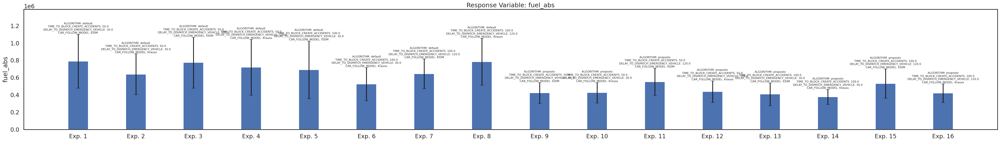

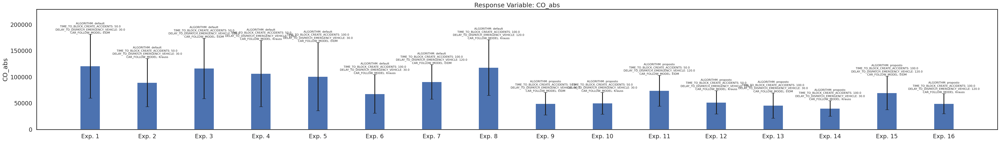

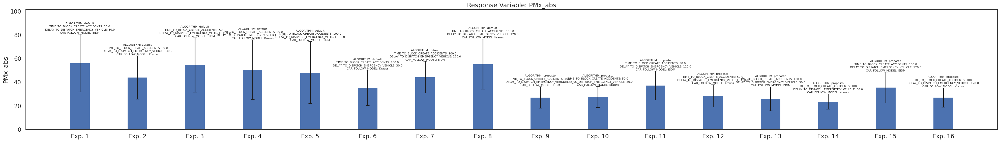

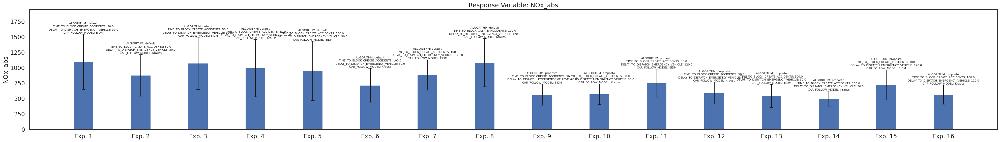

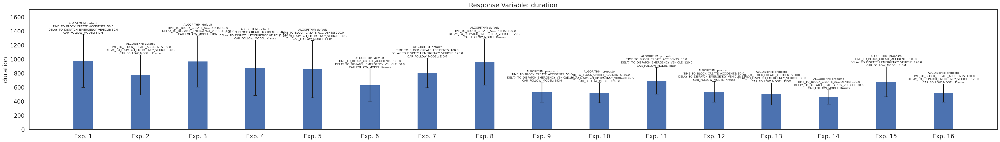

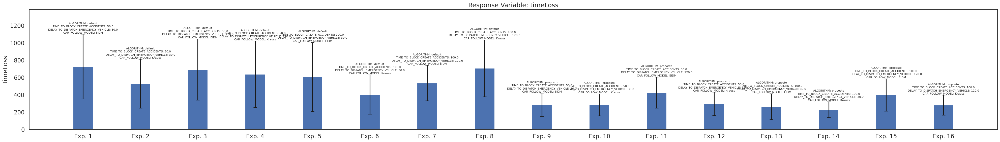

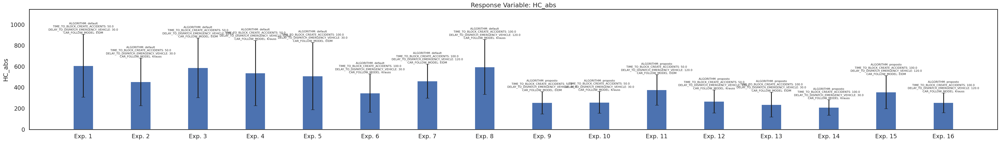

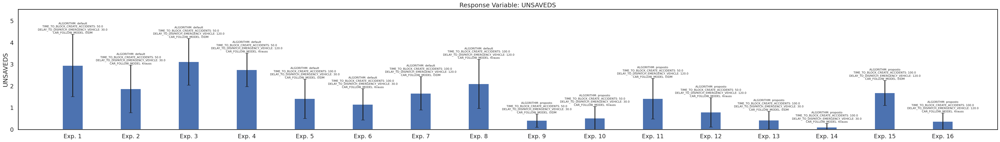

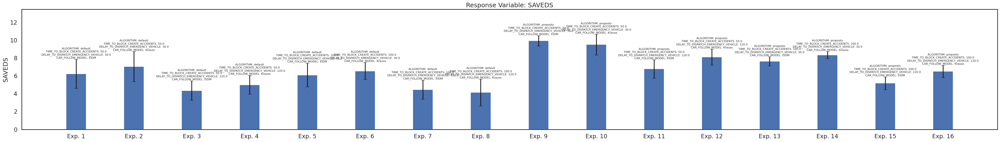

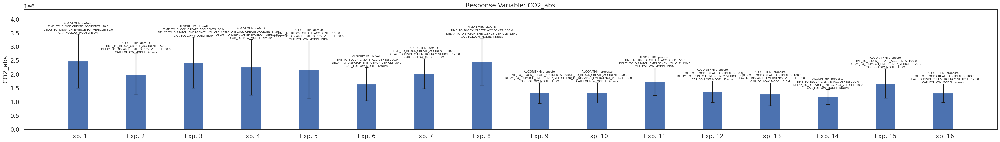

In [95]:
n_cols = 4
# Adjusting the bar width, if necessary
width = 0.35

for var_name in response_vars_names:
    # Increasing the chart height to accommodate labels
    plt.figure(figsize=(10 * n_cols, 6))  # Increasing the second value in figsize to increase the chart height
    
    n_experiments = len(experiment_settings_real_df)  # Number of experiments
    ind = np.arange(n_experiments)  # Indices for the experiments for bar positioning
    
    # Plotting the data from the real experiment settings
    bars = plt.bar(ind, experiment_settings_real_df[var_name],yerr=experiment_settings_real_df[var_name+"_err"],capsize=5,width= width, label='Experiments')
    # for i, (x_val, y_val, yerr_val) in enumerate(zip(grouped[column_x], grouped[(var, 'mean')], grouped[(var, 'mean_error')])):
    # plt.bar(x_val, y_val, yerr=yerr_val, color=colors[group_labels[i]], capsize=5)
    
    plt.title(f'Response Variable: {var_name}')  # Chart title
    plt.ylabel(var_name)  # Y-axis label
    
    # Generating labels for each bar based on factor combinations
    exp_labels = ['Exp. ' + str(exp) for exp in experiment_settings_real_df['Exp']]
    plt.xticks(ind, exp_labels)
    
    # Adding labels above bars to show factor combinations
    for bar, label in zip(bars, experiment_settings_real_df.to_dict('records')):
        height = bar.get_height()
        comb_label = '\n'.join([f"{k}: {v}" for k, v in label.items() if k in factor_names])
        height_err_plus = label[var_name+"_err"]
        plt.text(bar.get_x() + bar.get_width() / 2, height+height_err_plus, comb_label, ha='center', va='bottom', rotation=0, fontsize=8)
    
    # Adjusting the Y-axis limits to ensure labels fit without being cut off
    plt.ylim(0, plt.ylim()[1] * 1.2)  # Increases the upper limit of the Y-axis by 20%

    plt.tight_layout()
    # plt.savefig('../plot/Experiment/{}.pdf'.format(var_name), format='pdf')
    plt.savefig('../plot/Tripinfo_Emergency_Vehicle_Experiment/{}.pdf'.format(var_name), format='pdf')
    plt.show()


# Gráfico 2

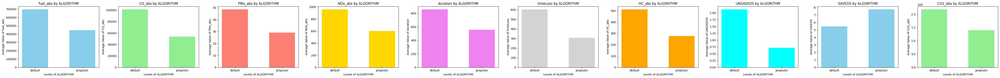

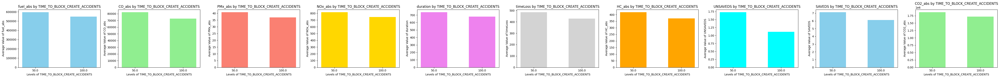

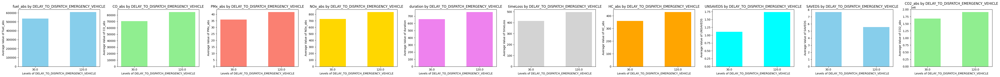

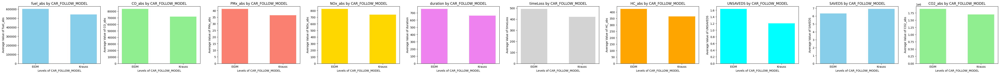

In [32]:
# Defining a color list for the response variables
colors = ['skyblue', 'lightgreen', 'salmon', 'gold', 'violet', 'lightgrey', 'orange', 'cyan']

# Bar width
width = 0.55

# Iterating through each factor
for factor_name in factor_names:
    unique_levels = np.sort(experiment_settings_real_df[factor_name].unique())
    
    # Determining the number of subplots based on the number of response variables
    n_vars = len(response_vars_names)
    
    # The number of columns equals the number of response variables
    n_cols = n_vars
    # Always 1 row since we are fitting everything in a single horizontal line
    n_rows = 1
    
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4))  # Adjusting size as necessary
    axs = axs.flatten() if n_vars > 1 else [axs]  # Ensures axs is always iterable
    
    for i, var_name in enumerate(response_vars_names):
        mean_values = []
        # Preparing data for plotting
        for level in unique_levels:
            level_data = experiment_settings_real_df[experiment_settings_real_df[factor_name] == level]
            mean_val = level_data[var_name].mean()
            mean_values.append(mean_val)
        
        # Bar positions on the X-axis
        ind = np.arange(len(unique_levels))
        
        # Choosing the color for the current response variable
        bar_color = colors[i % len(colors)]
        
        # Plotting the bars
        axs[i].bar(ind, mean_values, width, label=f'{var_name}', color=bar_color)
        
        axs[i].set_title(f'{var_name} by {factor_name}')
        axs[i].set_xticks(ind)
        axs[i].set_xticklabels(unique_levels, rotation=0)  # Adjusting rotation for better visualization if needed
        axs[i].set_xlabel(f'Levels of {factor_name}')
        axs[i].set_ylabel(f'Average Value of {var_name}')
        #axs[i].legend()
    
    plt.tight_layout()
    plt.savefig('../plot/Tripinfo_Emergency_Vehicle_Experiment/{}-{}.pdf'.format(factor_name,var_name), format='pdf')
    plt.show()


### Tabela de conferência

In [141]:
# Displaying the tables
print("\nDesign of the Experiment with Coded Levels:")
display(experiment_design_df)
print("\nExperiment Settings with Real Levels:")
display(experiment_settings_real_df)

# Calculating the effects and SS for each response variable
results = calculate_effects_SS_dynamic(experiment_design_df, response_vars_names)

# Printing the formatted results
#print_formatted_results(results)


Design of the Experiment with Coded Levels:


,Exp,ALGORITHM,TIME_TO_BLOCK_CREATE_ACCIDENTS,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,CAR_FOLLOW_MODEL,fuel_abs,fuel_abs_err,CO_abs,CO_abs_err,PMx_abs,...,ALGORITHM:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,ALGORITHM:CAR_FOLLOW_MODEL,TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,TIME_TO_BLOCK_CREATE_ACCIDENTS:CAR_FOLLOW_MODEL,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL,ALGORITHM:TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,ALGORITHM:TIME_TO_BLOCK_CREATE_ACCIDENTS:CAR_FOLLOW_MODEL,ALGORITHM:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL,TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL,ALGORITHM:TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL
0,1,-1,-1,-1,-1,790994.736654,312462.570562,120800.280264,60968.897096,56.213238,...,1,1,1,1,1,-1,-1,-1,-1,1
1,2,-1,-1,-1,1,639521.588304,236139.211900,89421.608598,45913.879209,44.039275,...,1,-1,1,-1,-1,-1,1,1,1,-1
2,3,-1,-1,1,-1,774203.356576,294928.994963,116517.281055,57824.661273,54.660979,...,-1,1,-1,1,-1,1,-1,1,1,-1
3,4,-1,-1,1,1,721045.932826,322491.629241,106611.222220,63125.323495,50.625482,...,-1,-1,-1,-1,1,1,1,-1,-1,1
4,5,-1,1,-1,-1,691077.665034,334429.325193,100738.135139,65033.704030,48.245899,...,1,1,-1,-1,1,1,1,-1,1,-1
5,6,-1,1,-1,1,526190.813651,191696.108523,67766.151400,37032.954159,35.262691,...,1,-1,-1,1,-1,1,-1,1,-1,1
6,7,-1,1,1,-1,644653.430026,172915.412443,90889.190451,33112.786151,44.381415,...,-1,1,1,-1,-1,-1,1,1,-1,1
7,8,-1,1,1,1,784746.617618,271590.167882,118182.009226,53152.247379,55.448931,...,-1,-1,1,1,1,-1,-1,-1,1,-1
8,9,1,-1,-1,-1,422423.385118,120509.435951,49210.823162,21557.833925,27.175545,...,-1,-1,1,1,1,1,1,1,-1,-1
9,10,1,-1,-1,1,425725.227484,117999.487761,49967.901770,20925.528254,27.519656,...,-1,1,1,-1,-1,1,-1,-1,1,1



Experiment Settings with Real Levels:


,Exp,ALGORITHM,TIME_TO_BLOCK_CREATE_ACCIDENTS,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,CAR_FOLLOW_MODEL,fuel_abs,fuel_abs_err,CO_abs,CO_abs_err,PMx_abs,...,ALGORITHM:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,ALGORITHM:CAR_FOLLOW_MODEL,TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,TIME_TO_BLOCK_CREATE_ACCIDENTS:CAR_FOLLOW_MODEL,DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL,ALGORITHM:TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE,ALGORITHM:TIME_TO_BLOCK_CREATE_ACCIDENTS:CAR_FOLLOW_MODEL,ALGORITHM:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL,TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL,ALGORITHM:TIME_TO_BLOCK_CREATE_ACCIDENTS:DELAY_TO_DISPATCH_EMERGENCY_VEHICLE:CAR_FOLLOW_MODEL
0,1,default,50.0,30.0,EIDM,790994.736654,312462.570562,120800.280264,60968.897096,56.213238,...,1,1,1,1,1,-1,-1,-1,-1,1
1,2,default,50.0,30.0,Krauss,639521.588304,236139.211900,89421.608598,45913.879209,44.039275,...,1,-1,1,-1,-1,-1,1,1,1,-1
2,3,default,50.0,120.0,EIDM,774203.356576,294928.994963,116517.281055,57824.661273,54.660979,...,-1,1,-1,1,-1,1,-1,1,1,-1
3,4,default,50.0,120.0,Krauss,721045.932826,322491.629241,106611.222220,63125.323495,50.625482,...,-1,-1,-1,-1,1,1,1,-1,-1,1
4,5,default,100.0,30.0,EIDM,691077.665034,334429.325193,100738.135139,65033.704030,48.245899,...,1,1,-1,-1,1,1,1,-1,1,-1
5,6,default,100.0,30.0,Krauss,526190.813651,191696.108523,67766.151400,37032.954159,35.262691,...,1,-1,-1,1,-1,1,-1,1,-1,1
6,7,default,100.0,120.0,EIDM,644653.430026,172915.412443,90889.190451,33112.786151,44.381415,...,-1,1,1,-1,-1,-1,1,1,-1,1
7,8,default,100.0,120.0,Krauss,784746.617618,271590.167882,118182.009226,53152.247379,55.448931,...,-1,-1,1,1,1,-1,-1,-1,1,-1
8,9,proposto,50.0,30.0,EIDM,422423.385118,120509.435951,49210.823162,21557.833925,27.175545,...,-1,-1,1,1,1,1,1,1,-1,-1
9,10,proposto,50.0,30.0,Krauss,425725.227484,117999.487761,49967.901770,20925.528254,27.519656,...,-1,1,1,-1,-1,1,-1,-1,1,1


### Gráfico 3

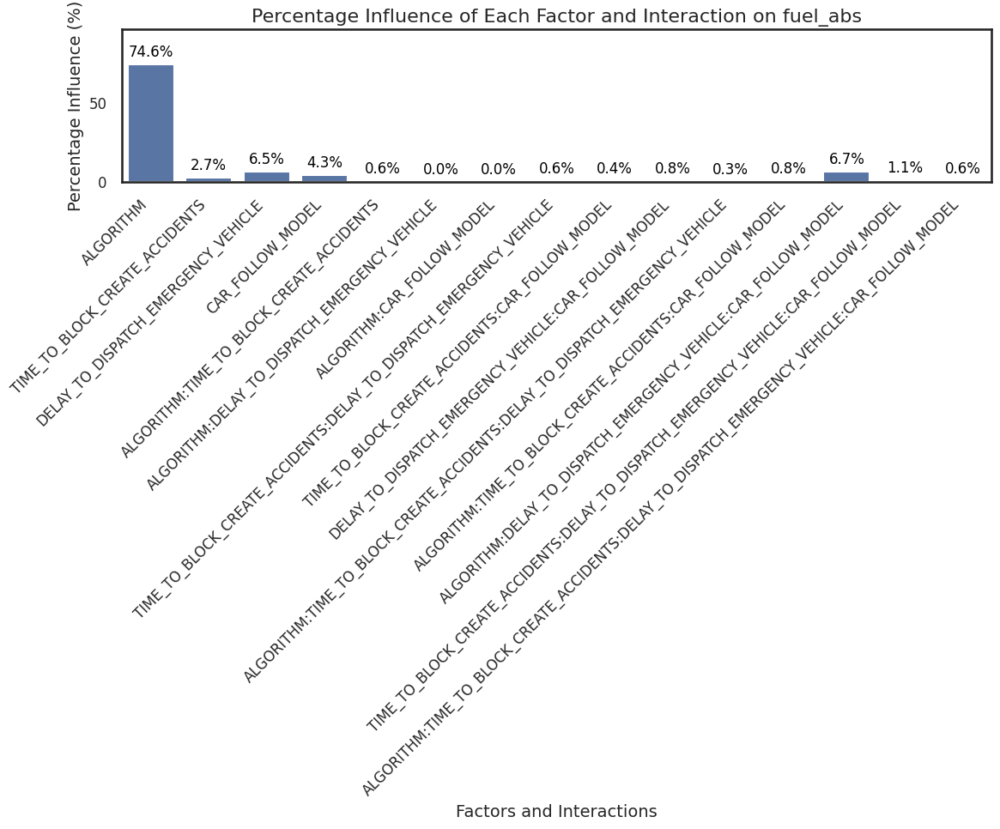

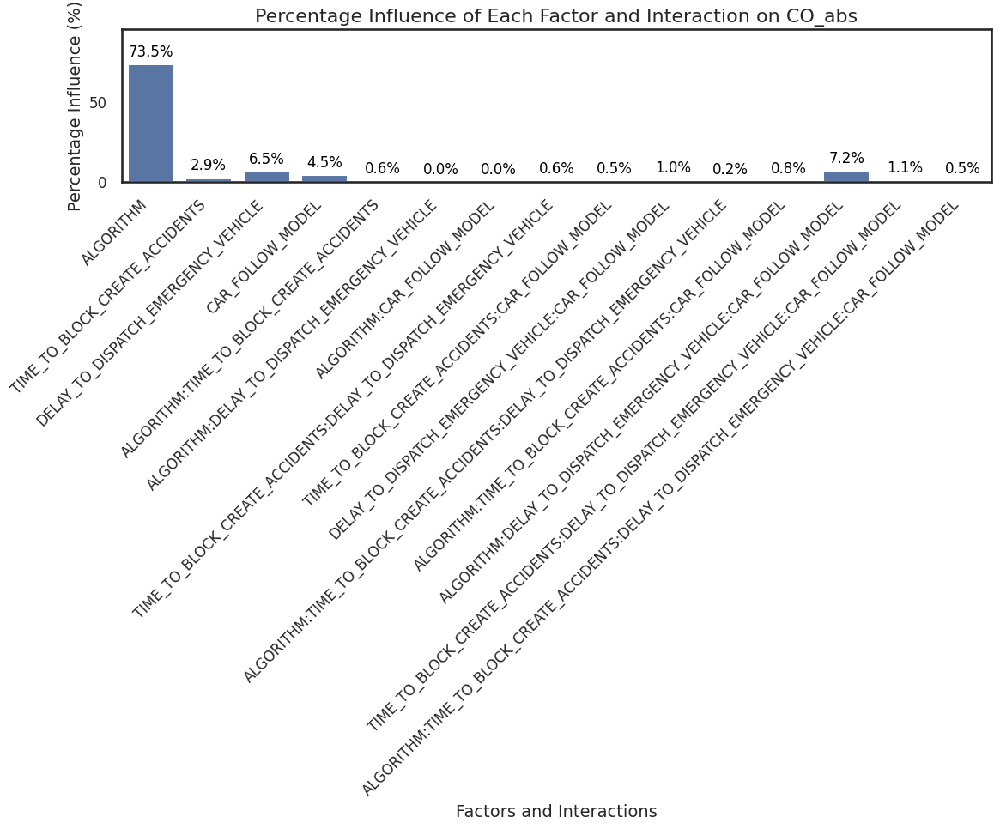

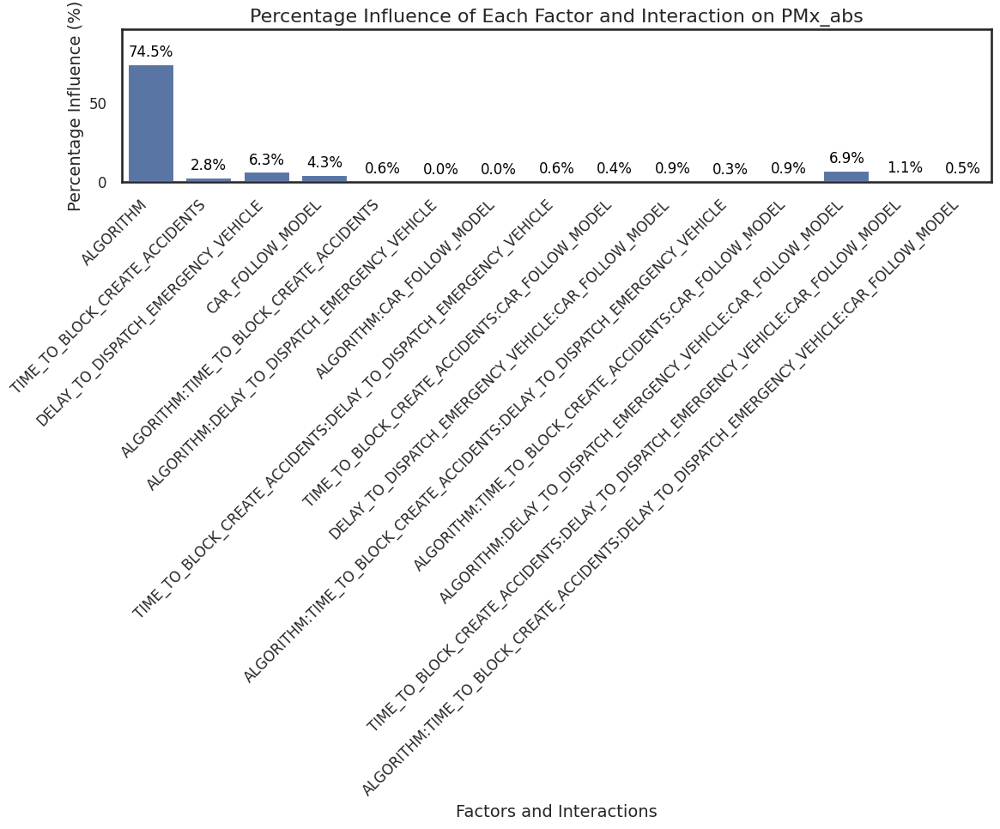

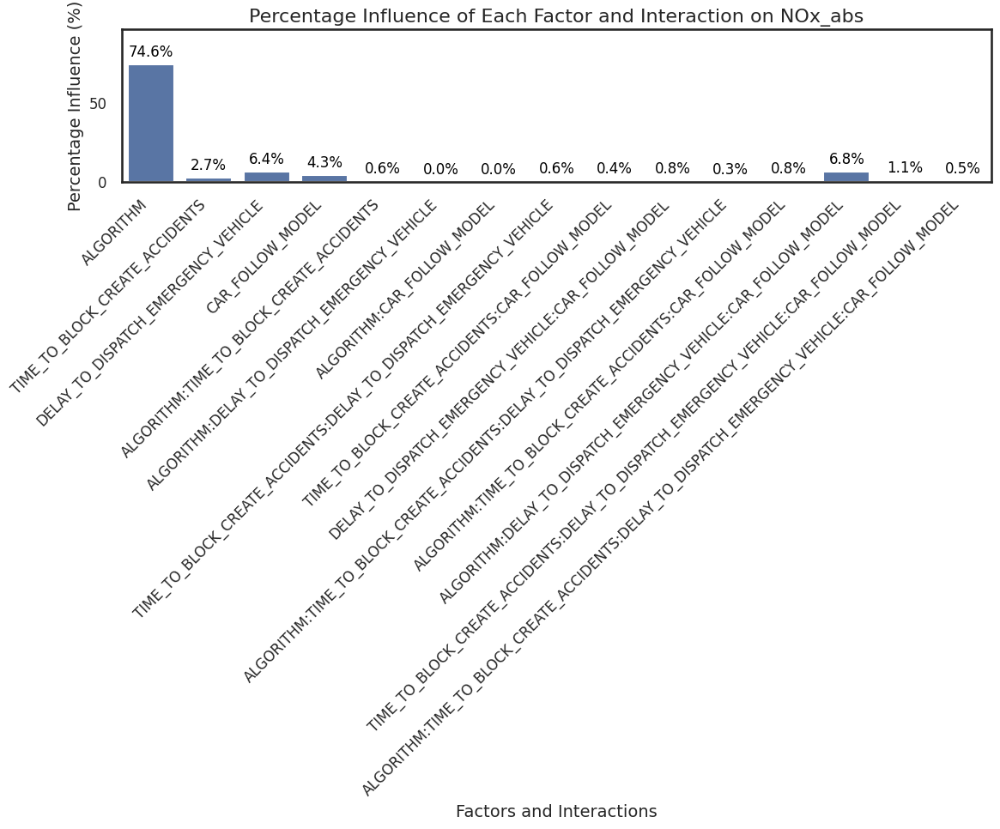

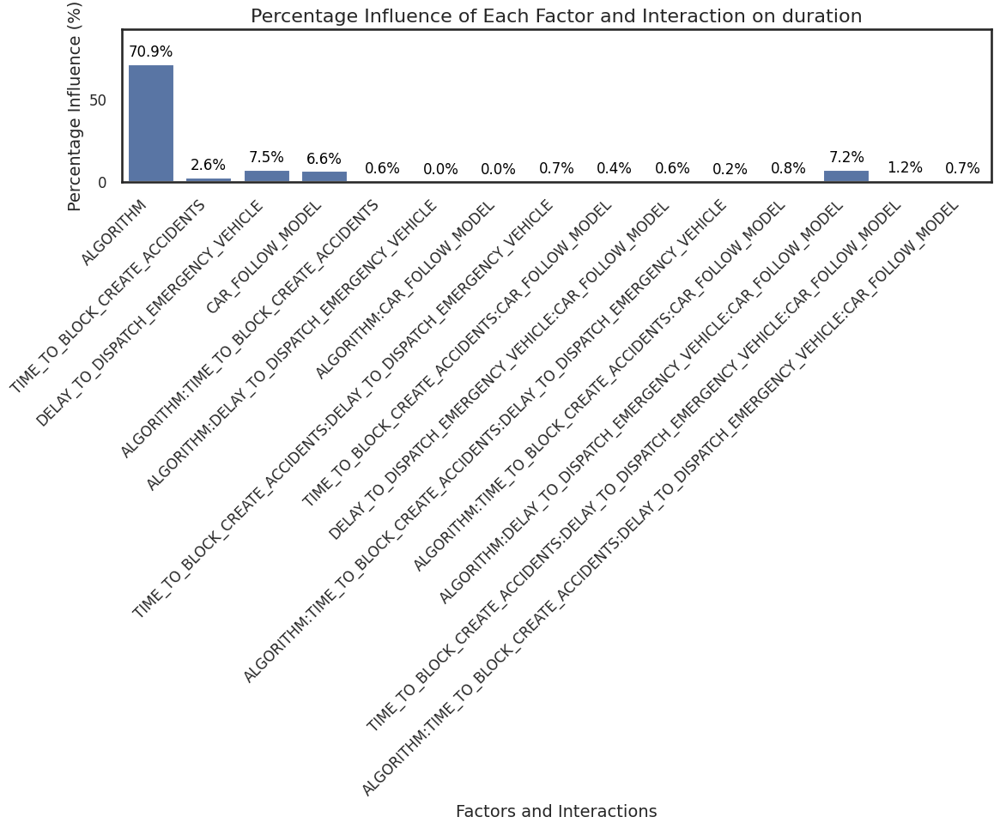

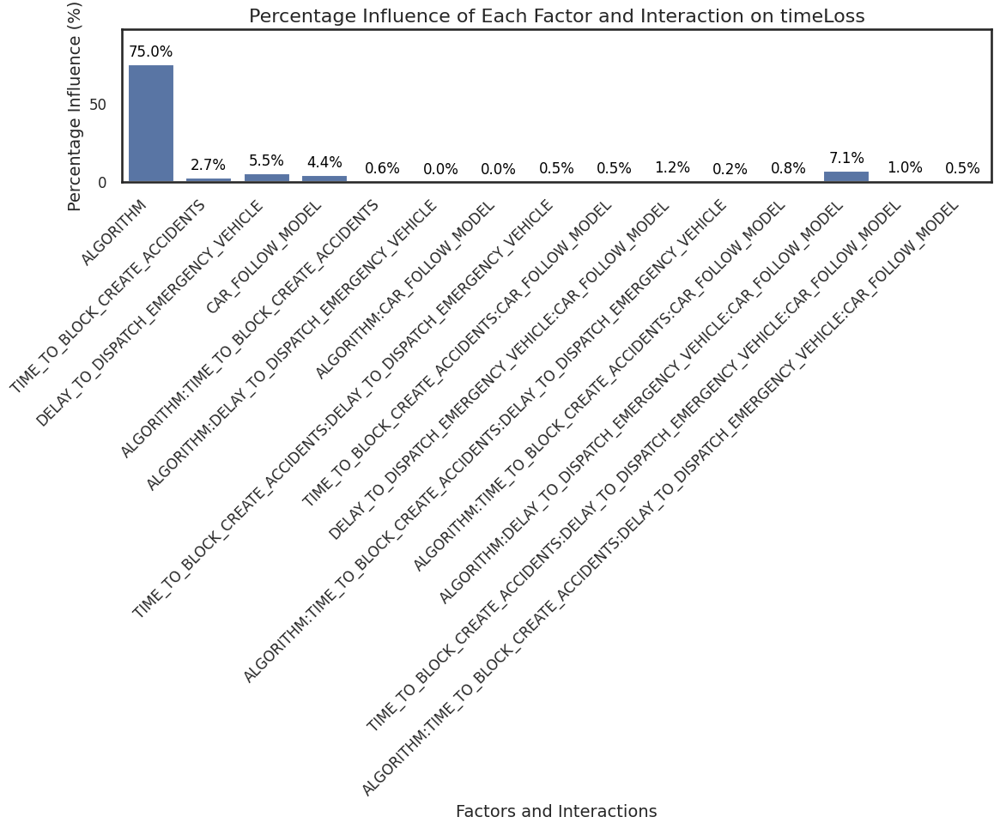

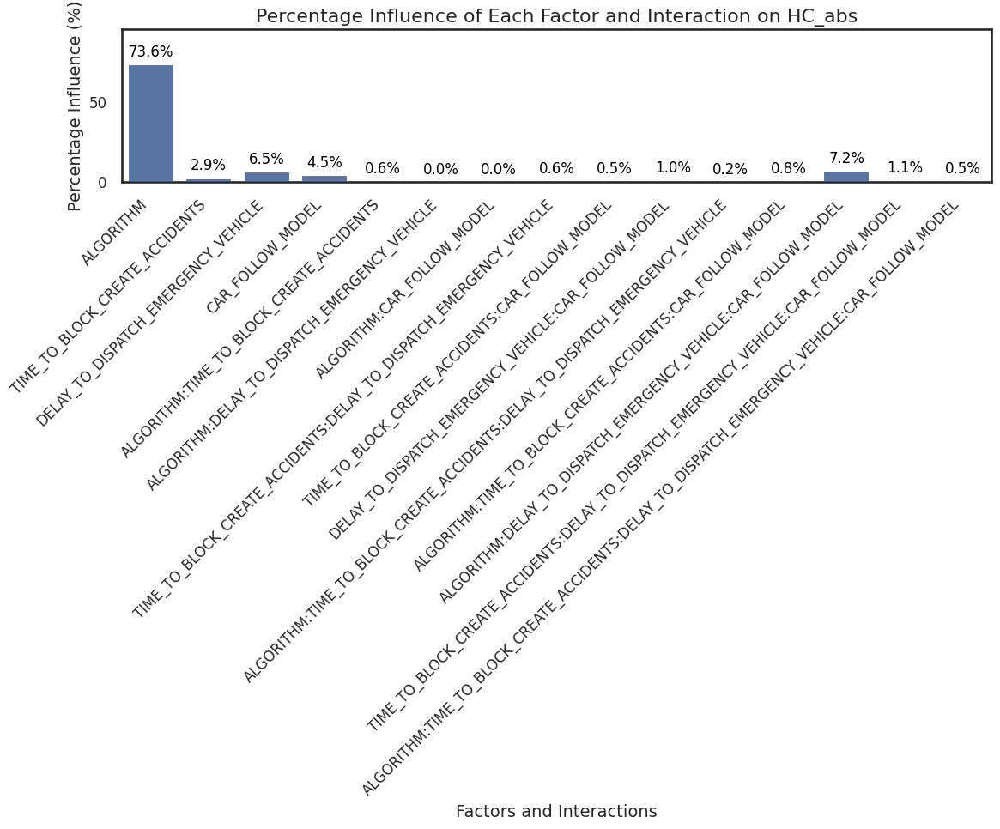

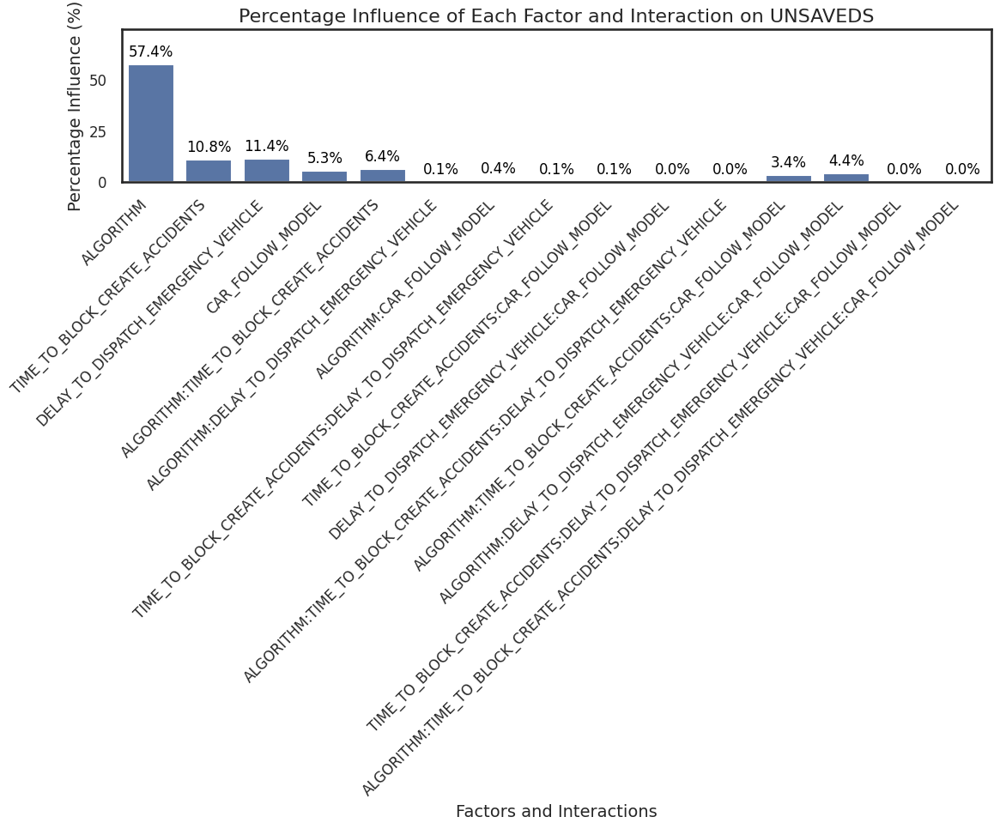

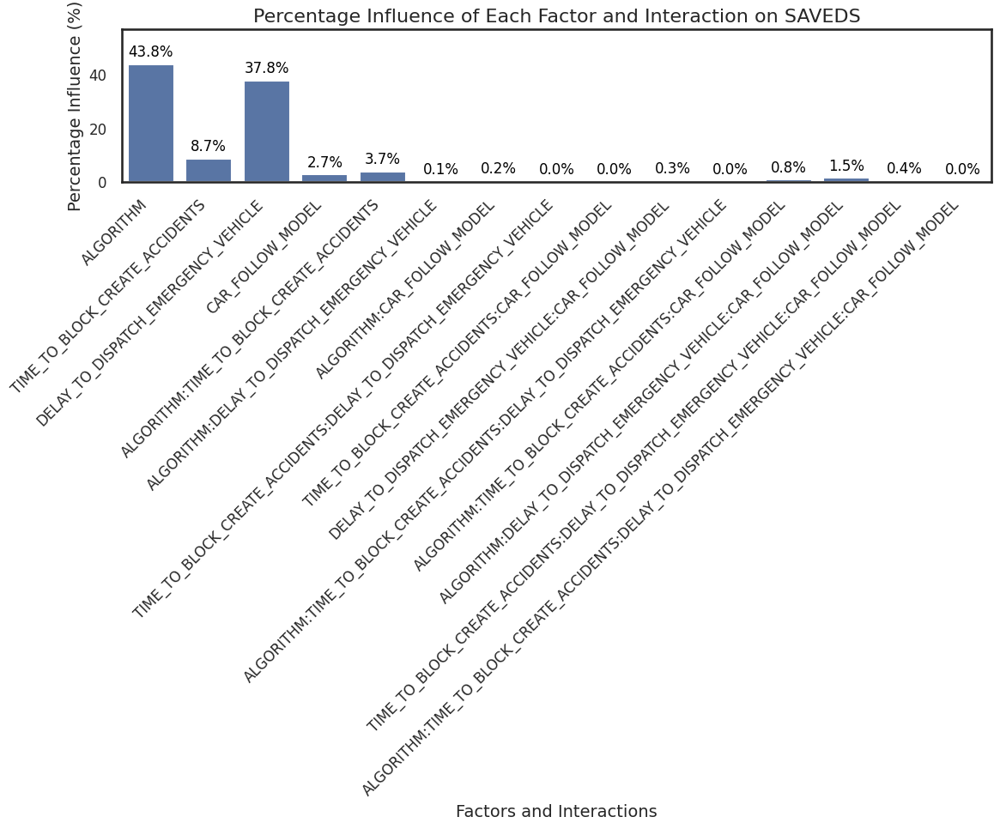

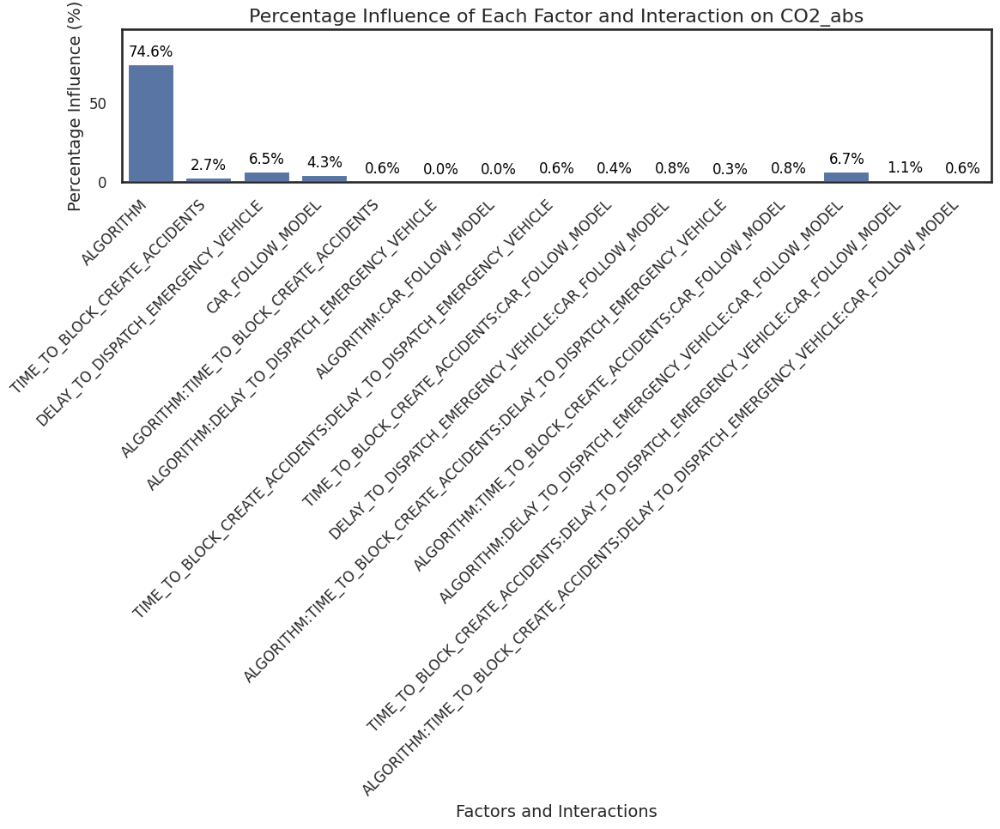

In [142]:
for response_var_name, (effects, SS, SST) in results.items():
    # Organizing data for plotting
    names = list(effects.keys())
    influences = [(ss / SST) * 100 for ss in SS.values()]
    
    # Creating a DataFrame for Seaborn
    data = pd.DataFrame({
        'Factors and Interactions': names,
        'Percentage Influence (%)': influences
    })
    
    # Creating the plot
    plt.figure(figsize=(12, 10))
    sns.set_theme(style="white", context="talk")
    ax = sns.barplot(x='Factors and Interactions', y='Percentage Influence (%)', data=data)
    plt.title(f"Percentage Influence of Each Factor and Interaction on {response_var_name}", fontsize=16)
    plt.ylabel('Percentage Influence (%)', fontsize=14)
    plt.xlabel('Factors and Interactions', fontsize=14)
    plt.xticks(rotation=45, ha="right", fontsize=12)
    plt.yticks(fontsize=12)
    plt.ylim(0, max(influences) * 1.3)  # Increase the upper y-axis limit by 30%
    plt.tight_layout()

    # Adding percentage labels above bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.1f}%', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 10), 
                    textcoords='offset points', fontsize=12, color='black')

    plt.tight_layout()
    plt.savefig('../plot/Tripinfo_Emergency_Vehicle_Experiment/{}.pdf'.format(response_var_name), format='pdf')
    plt.show()
    
    
# sns.barplot(influences
    
# )

In [ ]:
# # Adapted function to plot formatted results
# def plot_formatted_results(results):
#     print(results.items())
#     for response_var_name, (effects, SS, SST) in results.items():
#         # Organizing data for plotting
#         names = list(effects.keys())
#         influences = [(ss / SST) * 100 for ss in SS.values()]

#         # Creating the plot
#         plt.figure(figsize=(12, 10))
#         plt.bar(names, influences, color='skyblue')
#         plt.title(f"Percentage Influence of Each Factor and Interaction on {response_var_name}")
#         plt.ylabel('Percentage Influence (%)')
#         # Adjusting the y-axis limits to ensure labels fit without cutting off
#         plt.ylim(0, plt.ylim()[1] * 1.2)  # Increase the upper y-axis limit by 20%
#         plt.xlabel('Factors and Interactions')
#         plt.xticks(rotation=60, ha="right")
#         plt.tight_layout()

#         # Adding percentage labels above bars
#         for i, influence in enumerate(influences):
#             plt.text(i, influence + 0.5, f"{influence:.1f}%", ha='center', va='bottom')
        
#         plt.tight_layout()
#         plt.savefig('../plot/Tripinfo_Emergency_Vehicle_Experiment/{}.pdf'.format(response_var_name), format='pdf')
#         plt.show()

# # Assuming 'results' has been previously calculated by the provided code
# # results = calculate_effects_SS_dynamic(experiment_design_df, response_vars_names)
# # Printing formatted results
# # print_formatted_results(results)
# # Calling the adapted function to plot the results
# plot_formatted_results(results)


### Gráfico 5

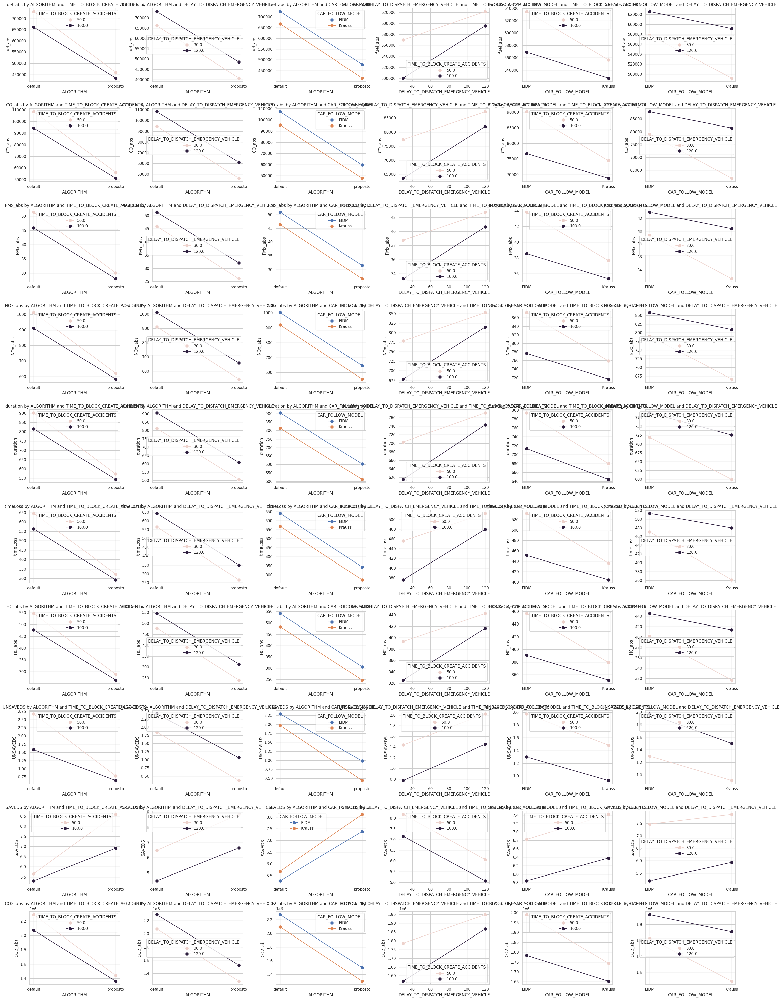

In [81]:
def plot_interaction_matrix_subplot(df, response_vars_names, factor_names):
    sns.set(style="whitegrid")
    
    # Determining the number of subplots needed based on the number of factor combinations
    num_factors = len(factor_names)
    num_combinations = num_factors * (num_factors - 1) // 2
    num_rows = len(response_vars_names)
    num_cols = max(1, num_combinations)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    if num_rows == 1:
        axes = [axes]
    if num_cols == 1:
        axes = np.array([axes]).transpose()
    
    for i, response_var_name in enumerate(response_vars_names):
        ax_index = 0
        for factor1 in factor_names:
            for factor2 in factor_names:
                if factor1 < factor2:  # Ensuring we don't repeat combinations
                    # Filtering data for the two factors and the current response variable
                    plot_data = df[[factor1, factor2, response_var_name]].dropna()
                    
                    # Selecting the correct subplot
                    ax = axes[i, ax_index] if num_rows > 1 else axes[ax_index]
                    
                    # Creating the interaction plot
                    interaction_plot = sns.lineplot(x=factor1, y=response_var_name, hue=factor2, data=plot_data, 
                                                    marker='o', linestyle='-', markersize=10, errorbar=None, ax=ax)
                    interaction_plot.set_title(f'{response_var_name} by {factor1} and {factor2}')
                    interaction_plot.set_xlabel(factor1)
                    interaction_plot.set_ylabel(response_var_name)
                    ax.legend(title=factor2)
                    
                    ax_index += 1
                    
    plt.tight_layout()
    plt.savefig('../plot/Tripinfo_Emergency_Vehicle_Experiment/interaction_matrix_subplot.pdf', format='pdf')
    plt.show()

# Adjusted function call
plot_interaction_matrix_subplot(experiment_settings_real_df, response_vars_names, factor_names)
